# A2 Image Stitching & Object Detection 

Student Name: Irene Huang 

Student ID : 260740689 

## 2 Image Stitching 

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

In [282]:
def warpPerspectivePadded(
        imgl, H, imgr_shape):
    """Performs an affine or Euclidean/rigid warp with padding.
    Parameters
    ----------
    imgl : image to be warped i.e. left image
    imgr : shape of static image i.e. shape of central image
    M : `3x3` Homography matrix.
    Returns
    -------
    src_warped : padded and warped source image
    """
    
    src = imgl
    dst_shape = imgr_shape
    M = H
    
    # it is enough to find where the corners of the image go to find
    # the padding bounds; points in clockwise order from origin
    _, src_w = src.shape[:2]
    lin_pts = np.array([
        [0, src_w],
        [0, 0],
        [1, 1]])
    # transform points
    transf_lin_pts = M.dot(lin_pts) #M[:, :2].dot(lin_pts) + M[:, 2].reshape(3, 1)
    transf_lin_pts /= transf_lin_pts[-1:,:]
    
    # find min and max points
    min_x = np.floor(np.min(transf_lin_pts)).astype(int)
    max_x = np.ceil(np.max(transf_lin_pts)).astype(int)

    # add translation to the transformation matrix to shift to positive values
    anchor_x = 0
    transl_transf = np.eye(3,3)
    if min_x < 0:
        anchor_x = -min_x
        transl_transf[0,2] = anchor_x
        
    shifted_transf = transl_transf.dot(M)
    shifted_transf /= shifted_transf[2,2]

    # create padded destination image
    dst_h, dst_w,_ = dst_shape
    dst_pad_w = anchor_x + max(max_x, dst_w)
    src_warped = cv2.warpPerspective(src, shifted_transf, (dst_pad_w, dst_h), borderMode=cv2.BORDER_CONSTANT, borderValue=0)
    return src_warped

#### 1 Compute SIFT keypoints and corresponding descriptors for left and central images.

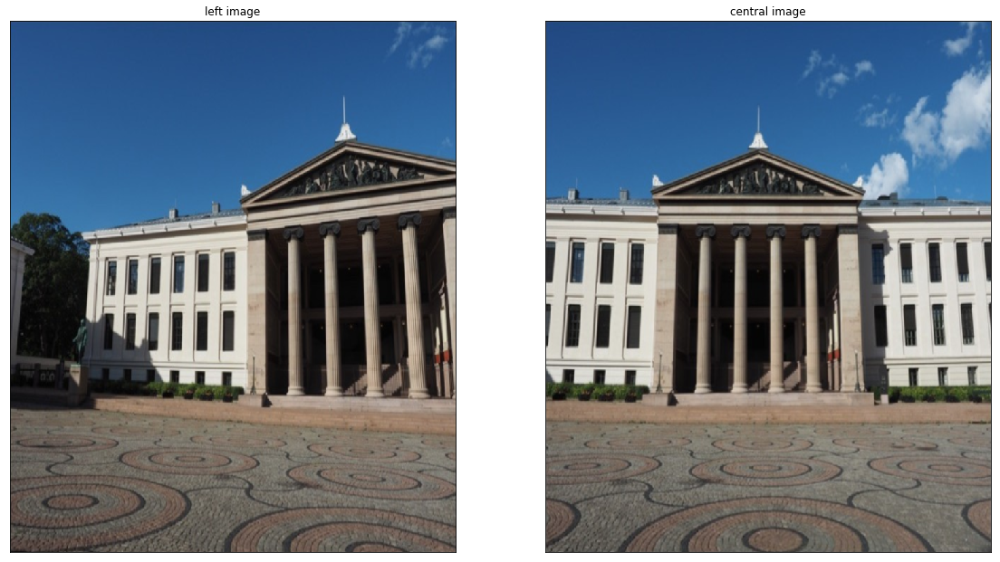

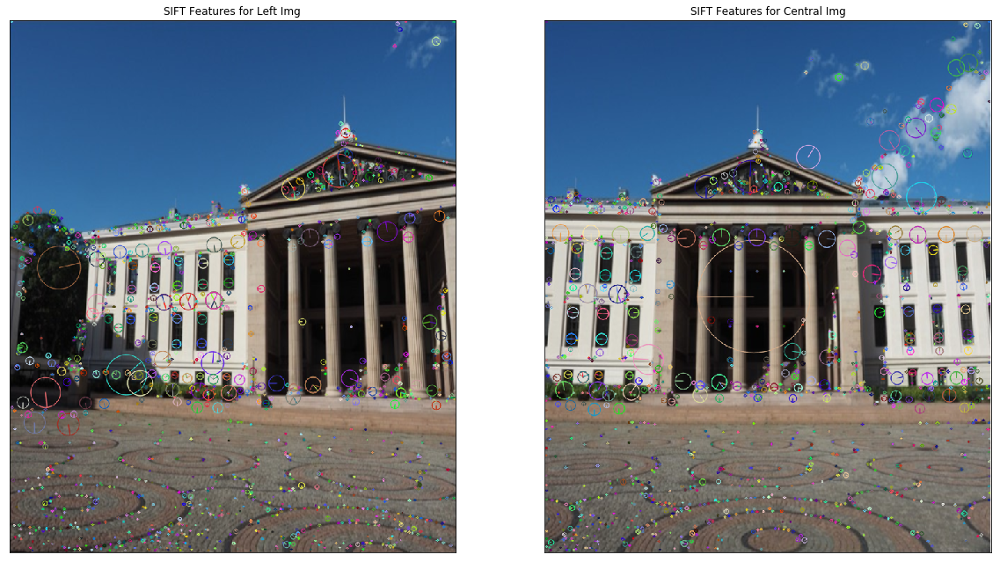

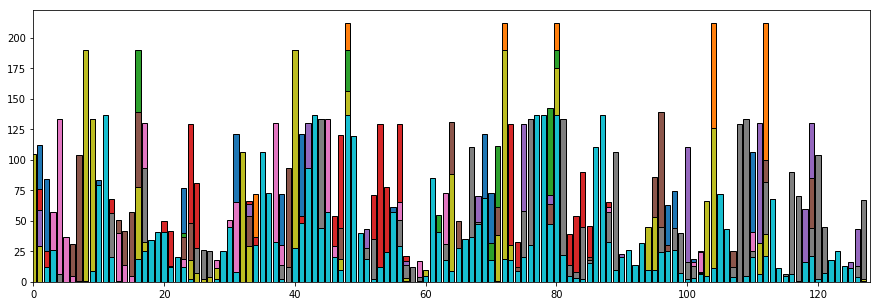

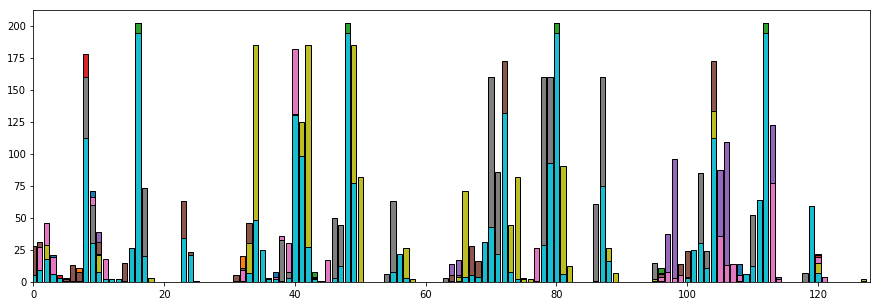

In [630]:
# read images 
# images reference: 
# https://craftofcoding.wordpress.com/2017/10/10/making-a-simple-panorama/
img1 = cv2.imread("image1.png")
img2 = cv2.imread("image2.png")
img3 = cv2.imread("image3.png")

size = (704, 840)

# resize image into the same shape 
img1 = cv2.resize(img1, size)
img2 = cv2.resize(img2, size)
img3 = cv2.resize(img3, size)

# size = (img1.shape[1]//14, img1.shape[0]//14)

# img1 = cv2.resize(img1, size)
# img2 = cv2.resize(img2, size)
# print(img1.shape)

# img1 = cv2.GaussianBlur(img1, (5,5), math.sqrt(2))
# img2 = cv2.GaussianBlur(img2, (5,5), math.sqrt(2))

imgleft_kp = img1.copy()
imgcenter_kp = img2.copy()

# conversion 
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# display original images 
plt.figure(figsize=(30, 30))
plt.subplot(131), plt.imshow(img1)
plt.title("left image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img2)
plt.title("central image"), plt.xticks([]), plt.yticks([])
# plt.subplot(133), plt.imshow(img3)
# plt.title("right image"), plt.xticks([]), plt.yticks([])

# Compute SIFT Keypoints 

# conversion
imgleft_kp = cv2.cvtColor(imgleft_kp, cv2.COLOR_BGR2RGB)
imgcenter_kp = cv2.cvtColor(imgcenter_kp, cv2.COLOR_BGR2RGB)
# imgright_kp = cv2.cvtColor(imgright_kp, cv2.COLOR_BGR2RGB)


# create SIFT objects
sift_obj = cv2.xfeatures2d.SIFT_create() 

# detect SIFT features, compute keypoint. Can pass a mask if want to search only a part of image
# Computer SIFT Descriptor
keypoint_left, descriptors_left = sift_obj.detectAndCompute(img1, None)  
keypoint_central, descriptors_central = sift_obj.detectAndCompute(img2, None)

# draw keypoints on left and central images 
    # draw small circles on the locations of the kepoints 
    # if pass cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, it will draw
    # a circle with size of keypoint and it will show its origintation 
    # ref: https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_sift_intro/py_sift_intro.html
cv2.drawKeypoints(img1, keypoint_left, imgleft_kp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(img2, keypoint_central, imgcenter_kp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(imgleft_kp)
plt.title("SIFT Features for Left Img"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(imgcenter_kp)
plt.title("SIFT Features for Central Img"), plt.xticks([]), plt.yticks([])


# plot 10 SIFT descriptors
num = 10
plt.figure(figsize=(15,5))
for i in range(num):
    plt.bar(np.arange(0,128),descriptors_left[i], edgecolor='k')
    plt.xlim([0,128])
    

plt.figure(figsize=(15,5))
for j in range(num):
    plt.bar(np.arange(0,128),descriptors_central[j], edgecolor='k')
    plt.xlim([0,128])

plt.show()

#### 2 Find matching keypoints in two images and display the 20 best pairs.

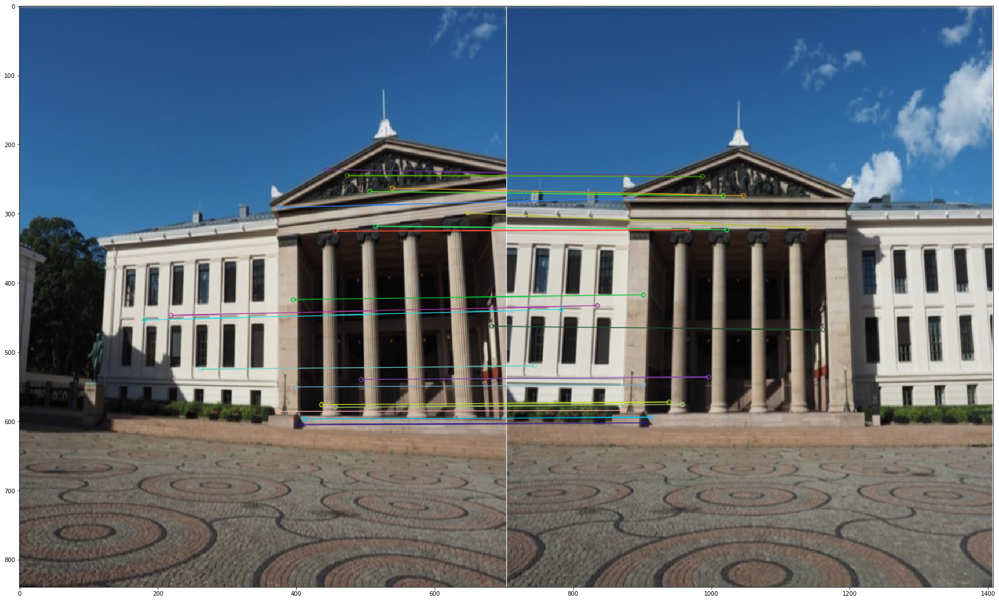

In [631]:
# Create BFMatcher object 

    # cv2.BFMatcher(): For each descriptor in the first set, this matcher finds 
    # the closest descriptor in the second set by trying each one. 
    # This descriptor matcher supports masking permissible matches 
    # of descriptor sets.
    # reference: https://docs.opencv.org/3.4/d3/da1/classcv_1_1BFMatcher.html#details

bf = cv2.BFMatcher() 

# Match descriptors in two images 
matches = bf.match(descriptors_left, descriptors_central)

# Sort matches in distance 
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints on images 

imgMatch = cv2.drawMatches(img1, keypoint_left, img2,  keypoint_central, matches[:20], img1, flags=2)
# imgMatch = cv2.drawMatches(img2, keypoint_central, img1,  keypoint_left, matches[:20], img2, flags=2)

plt.figure(figsize=(30,30))
plt.imshow(imgMatch)
plt.show()




#### 3 Find homography using RANSAC method. Implement RANSAC from scratch. Do not use OpenCV implementation. (6 points)
 – Steps to compute homography using RANSAC are given in Lecture 9 - slide 52.
 
 – Note on step 3: Compute H using opencv function findHomography with method=0.
 
 – Note on step 5: Before computing distance, convert projected key- points from homogeneous to euclidean space using opencv function convertPointsFromHomogeneous.

#### &

#### 4 Apply transformation to left image. Central image should not be transformed. You are given a function warpPerspectivePadded. Use this function instead of OpenCV function warpPerspective for image trans- formation.


In [636]:
def ransac(source, dest): 

    # set the number of samples N
    numOfSamples = 1000
    sampleCount = 0
    distanceThresh = 30
    distance_array = []
    numOfInlier = 0
    maxInlier = 0
    finalH = []
    best_dest_inlier = []
    best_source_inlier = []

    while sampleCount < numOfSamples:  # repeat for N times 

        # choose 4 random potential matches 
        random1 = np.random.randint(0, len(dest))
        random2 = np.random.randint(0, len(dest))
        random3 = np.random.randint(0, len(dest))
        random4 = np.random.randint(0, len(dest))
        random_dest = np.array([dest[random1], dest[random2],dest[random3],dest[random4]]) # choose value in array
        random_source = np.array([source[random1], source[random2],source[random3],source[random4]]) 

        # compute H using four potential matches 
        H, __ = cv2.findHomography(random_source, random_dest, 0)
        
        # store the remaining points in arrays
        array_dest = []  
        array_source = []
        
        for i in range(len(dest)): 
            if i != random1 and i != random2 and i != random3 and i != random4: 
                
                array_dest.append(dest[i])
        
        for i in range(len(source)): 
            
            if i != random1 and i != random2 and i != random3 and i != random4: 
                array_source.append(source[i])
                
        array_dest = np.array(array_dest)
        array_source = np.array(array_source)
           
        source_inlier = [] 
        destination_inlier = []
        
        # calculate calculate distance and count inliers 
        for i in range (0, len(array_dest)):  # at most four times 

            # project points from x to x' for each potentially matching pair Xi' = HXi
            mpc_reshape = np.array([array_source[i].item(0), array_source[i].item(1), 1])
            projectpoints = np.dot(mpc_reshape, H.T)
            projectpoints = np.array([[projectpoints[0], projectpoints[1], 1]])
         
            # convert keypoints to eucliean space 
            estimate_array = cv2.convertPointsFromHomogeneous(projectpoints)
            estimate_array = [[estimate_array[0].item(0), estimate_array[0].item(1)]]
          
            # count points with projected distance < t using a for loop 
            est_x = estimate_array[0][0]
            est_y = estimate_array[0][1]
            array_dest_x = array_dest[i].item(0)
            array_dest_y = array_dest[i].item(1)
            
            # calculate distance 
            distance = np.sqrt(np.square(est_x - array_dest_x) + np.square(est_y - array_dest_y))
            
            # count inliers with distance threshold 
            if distance < distanceThresh and distance != 0:
#                 print("distance is ", distance)
                numOfInlier = numOfInlier + 1 
                source_inlier.append(array_source[i])
                destination_inlier.append(array_dest[i])
                
        source_inlier = np.array(source_inlier)
        destination_inlier = np.array(destination_inlier)
        
        # update the best inliers
        if numOfInlier > maxInlier: 
            best_source_inlier = source_inlier
            best_dest_inlier = destination_inlier 
            best_source_inlier = np.array(best_source_inlier)
            best_dest_inlier = np.array(best_dest_inlier)
            maxInlier = numOfInlier 
            print("max inlier is ", maxInlier)

        # reset values 
        numOfInlier = 0 
        array_source = [] 
        array_dest = [] 
        source_inlier = []
        destination_inlier = [] 

        # update the number of samples 
        sampleCount = sampleCount + 1
        
    return best_source_inlier, best_dest_inlier 

max inlier is  236
max inlier is  382
The Homography is:  [[ 1.74240874e+00 -4.03136049e-02  4.14843366e+02]
 [ 2.52784144e-01  1.26067274e+00 -1.34687805e+02]
 [ 5.05613314e-04  1.41219655e-05  1.00000000e+00]]


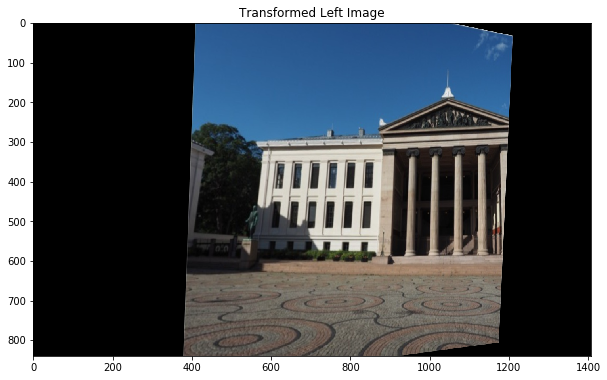

'\nOne of the best Homography I found \n[[ 2.43936055e+00  1.23282762e-01  3.50994918e+02]\n [ 5.00811454e-01  1.65142743e+00 -2.59517643e+02]\n [ 1.01452507e-03  3.04780250e-04  1.00000000e+00]]\n'

In [642]:
# find good match
GoodMatches = [] 
for j, k in enumerate(matches): 
    if k.distance < 1000: 
        GoodMatches.append((k.trainIdx, k.queryIdx))

# Arrange matching keypoints in two lists 
dest = np.float32([keypoint_central[j].pt for(j, __) in GoodMatches])
source = np.float32([keypoint_left[j].pt for(__, j) in GoodMatches])

# shift image so it could stitch properly 
shift = img2.shape[1]
for i in range(len(dest)):
    dest[i][0] += shift
    
best_source_inlier, best_dest_inlier  = ransac(source, dest)

finalH_1, __ = cv2.findHomography(best_source_inlier, best_dest_inlier, 0)
print("The Homography is: ", finalH_1)

transformed_1 = cv2.warpPerspective(img1, finalH_1, (img2.shape[1]+img1.shape[1],img2.shape[0])) # imgr: image to transform, and keep the left one 
# transformed = warpPerspectivePadded(img1, finalH, img2.shape) # (img2.shape[0],img2.shape[1]+img1.shape[1], __)

plt.figure(figsize=(10,10))
plt.imshow(transformed_1), plt.title("Transformed Left Image")
plt.show() 


"""
One of the best Homography I found 
[[ 2.43936055e+00  1.23282762e-01  3.50994918e+02]
 [ 5.00811454e-01  1.65142743e+00 -2.59517643e+02]
 [ 1.01452507e-03  3.04780250e-04  1.00000000e+00]]
"""

704


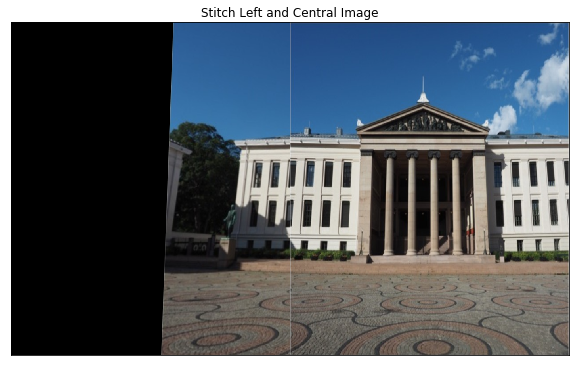

In [643]:
plt.figure(figsize=(10,10))
glued_1 = transformed_1.copy() 
print(img2.shape[1])
glued_1[:,img2.shape[1]:,:]=img2
plt.imshow(glued_1), plt.title("Stitch Left and Central Image")
plt.xticks([]), plt.yticks([])
plt.show() 

#### 5 Stitch transformed left image and original central image together using pyramid image blending

In [644]:
# define pyramid_blending function 
# img1: left image 
# img2: right image 
# level: Laplacian level 

def pyramid_blending(img1, img2, level): 
    # generate Gaussian pyramid for img1 and img2
    GA = img1.copy()
    gpA = [GA]
    for i in range(level):
        GA = cv2.pyrDown(GA) # blur image and downsample 
        gpA.append(GA)
    
    GB = img2.copy()
    gpB = [GB]
    for i in range(level):
        GB = cv2.pyrDown(GB)
        gpB.append(GB)
        
    # generate Laplacian Pyramid for img1 and img2 
    lpA = [gpA[level-1]]
    lpB = [gpB[level-1]]
    
    for j in range(level-1, 0, -1):  # decrement by 1 each time 
        heightA, widthA, _ = gpA[j-1].shape
        heightB, widthB, _ = gpB[j-1].shape
        GE = cv2.pyrUp(gpA[j],dstsize=(widthA, heightA))
        L = cv2.subtract(gpA[j-1],GE)
        lpA.append(L)
        GE = cv2.pyrUp(gpB[j], dstsize=(widthB, heightB))
        K = cv2.subtract(gpB[j-1],GE)
        lpB.append(K)
    
    # add img1 and img2 with equal weight 
    LS = [] 
    for la,lb in zip(lpA, lpB):
#         r, c, d = la.shape
#         ls = np.hstack((la[:,0:c//2], lb[:,c//2:]))
        ls = np.hstack((la, lb))
        LS.append(ls)
    
    ls = LS[0]
    for k in range(1,level):
        height,width,_ = LS[k].shape

#         ls = cv2.pyrUp(ls, dstsize=(width,height))
        ls = cv2.pyrUp(ls,dstsize=(width,height))
        ls.astype(np.uint8) 
        ls = cv2.add(ls, LS[k])
    
    return ls


(<matplotlib.image.AxesImage at 0x1366db7f0>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

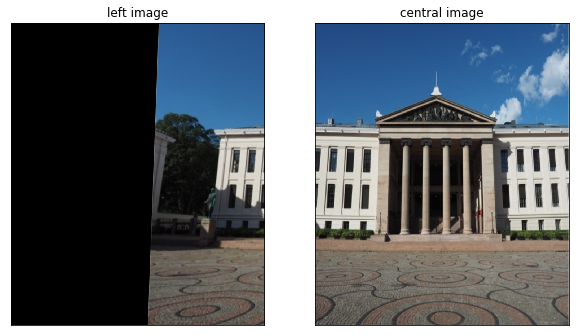

In [645]:
# stitch transformed images

blend_left = transformed_1[:,:img1.shape[1]]
blend_central = img2 # glued[:,img2.shape[1]:,:]


# stitch transformed left and central image using pyramid image blending 
blend_image = pyramid_blending(blend_left, blend_central, 5) 

# display seperate images 
plt.figure(figsize=(10,10))
plt.subplot(121), plt.title("left image")
plt.imshow(blend_left), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.title("central image") 
plt.imshow(blend_central), plt.xticks([]), plt.yticks([])

#### 6 Display stitched image.

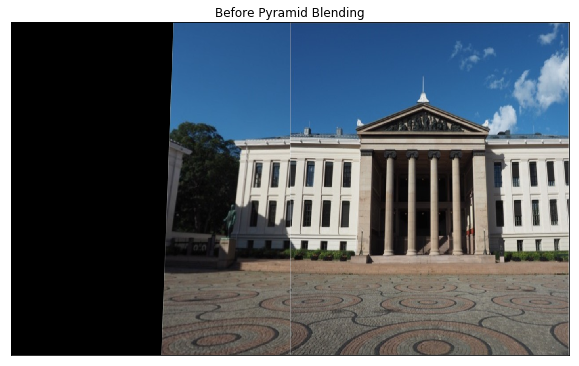

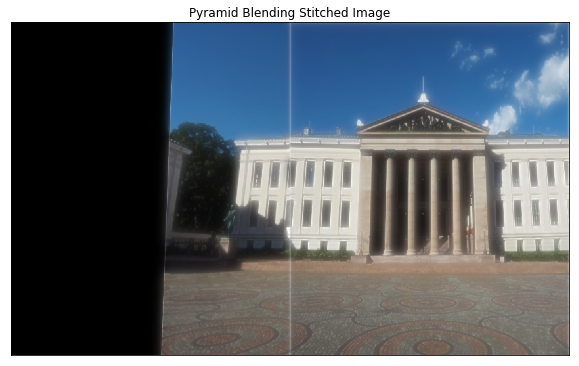

In [646]:
# display stitched image using pyramid blending
plt.figure(figsize=(10,10))
plt.imshow(glued_1), plt.title("Before Pyramid Blending")
plt.xticks([]), plt.yticks([])
plt.show() 

plt.figure(figsize=(10,10))
plt.imshow(blend_image), plt.title("Pyramid Blending Stitched Image")
plt.xticks([]), plt.yticks([])
plt.show()


#### Now let’s stitch above resultant image with a right image.
#### 7 Compute SURF keypoints and corresponding descriptors for above stitched image and right image.

(840, 1408, 3)
(840, 704, 3)
(280, 469, 3)
(280, 234, 3)
547
570


(Text(0.5, 1.0, 'SURF Features for Central Img'),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

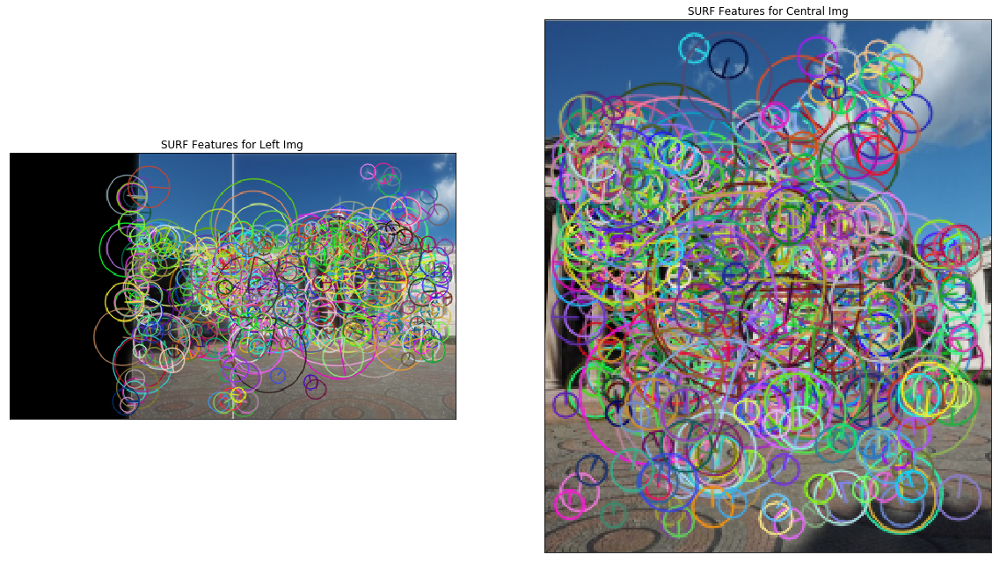

In [648]:
left_img = blend_image.copy() 
right_img = img3

print(left_img.shape)
print(right_img.shape)

# resize the images so that it could find more accurate matching points 
size1 = (left_img.shape[1]//3, left_img.shape[0]//3)
size2 = (right_img.shape[1]//3, right_img.shape[0]//3)
left_img = cv2.resize(left_img, size1)
right_img = cv2.resize(right_img, size2)
print(left_img.shape)
print(right_img.shape)

right_img = cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB)

# Convert to gray scale 
left_img_gray = cv2.cvtColor(left_img, cv2.COLOR_BGR2GRAY) 
right_img_gray = cv2.cvtColor(right_img, cv2.COLOR_BGR2GRAY)

left_img_result = left_img.copy()
right_img_result = right_img.copy() 

# create SURF object 
surf = cv2.xfeatures2d.SURF_create() 

# image should be im gray scale (reference: 
# https://docs.opencv.org/2.4/modules/nonfree/doc/feature_detection.html)
# in SURF.detectAndCompute(img, None)

# compute SURF keypoints and descriptors 
keypoint_left, descriptor_left = surf.detectAndCompute(left_img_gray, None)
keypoint_right, descriptor_right = surf.detectAndCompute(right_img_gray, None)

print(len(keypoint_left))
print(len(keypoint_right))

# draw keypoints 
cv2.drawKeypoints(left_img, keypoint_left, left_img_result,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(right_img, keypoint_right, right_img_result,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display images with keypoints 
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(left_img_result)
plt.title("SURF Features for Left Img"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(right_img_result)
plt.title("SURF Features for Central Img"), plt.xticks([]), plt.yticks([])

#### 8 Find matching keypoints in two images and display the 20 best pairs.

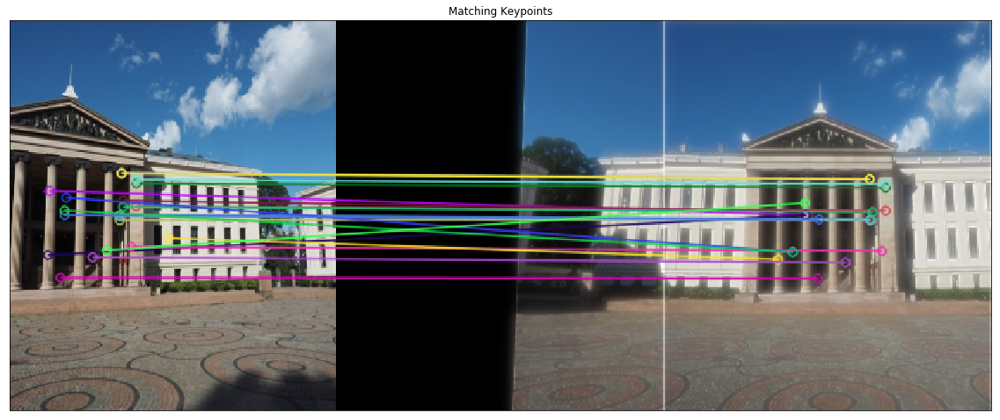

In [649]:
# Create BFMatcher object 
bf = cv2.BFMatcher() 

# Match descriptors in two images 
matches = bf.match(descriptor_right, descriptor_left)

# matches = bf.knnMatch(descriptor_right, descriptor_left, k=10)
   
# Sort matches in distance 
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints on images 
# imgMatch = cv2.drawMatchesKnn(left_img, keypoint_left, right_img, keypoint_right, matches[:20], right_img, flags=2)
# imgMatch = cv2.drawMatches(left_img, keypoint_left, right_img, keypoint_right, matches[:20], left_img, flags=2)

imgMatch = cv2.drawMatches(right_img, keypoint_right, left_img, keypoint_left, matches[:20], right_img, flags=2)

plt.figure(figsize=(20,20)), plt.xticks([]), plt.yticks([])
plt.imshow(imgMatch), plt.title("Matching Keypoints")
plt.show()

#### 9 Find homography using RANSAC method. Use above implemented RANSAC function. Do not use OpenCV implementation.
#### & 
#### 10 Apply transformation to right image. The stitched image should not be transformed. Use OpenCV function warpPerspective for image transfor- mation.

In [680]:
#### Ransac 

def ransac(source, dest): 

    # set the number of samples N
    numOfSamples = 1000
    sampleCount = 0
    distanceThresh = 35
    distance_array = []
    numOfInlier = 0
    maxInlier = 0
    finalH = []
    best_dest_inlier = []
    best_source_inlier = []

    while sampleCount < numOfSamples:  # repeat for N times 

        # choose 4 random potential matches 
        random1 = np.random.randint(0, len(dest))
        random2 = np.random.randint(0, len(dest))
        random3 = np.random.randint(0, len(dest))
        random4 = np.random.randint(0, len(dest))
        random_dest = np.array([dest[random1], dest[random2],dest[random3],dest[random4]]) # choose value in array
        random_source = np.array([source[random1], source[random2],source[random3],source[random4]]) 

        # compute H using four potential matches 
        H, __ = cv2.findHomography(random_source, random_dest, 0)
        
        array_dest = []  
        array_source = []
        
        # store other points in arrays 
        for i in range(len(dest)): 
            if i != random1 and i != random2 and i != random3 and i != random4: 
                
                array_dest.append(dest[i])
        
        for i in range(len(source)): 
            
            if i != random1 and i != random2 and i != random3 and i != random4: 
                array_source.append(source[i])
                
        array_dest = np.array(array_dest)
        array_source = np.array(array_source)
           
        source_inlier = [] 
        destination_inlier = []
        
        # calculate calculate distance and count inliers 
        for i in range (0, len(array_dest)):  # at most four times 

            # project points from x to x' for each potentially matching pair Xi' = HXi
            mpc_reshape = np.array([array_source[i].item(0), array_source[i].item(1), 1])
            projectpoints = np.dot(mpc_reshape, H.T)
            projectpoints = np.array([[projectpoints[0], projectpoints[1], 1]])
         
            # convert keypoints to eucliean space 
            estimate_array = cv2.convertPointsFromHomogeneous(projectpoints)
            estimate_array = [[estimate_array[0].item(0), estimate_array[0].item(1)]]
          
            # count points with projected distance < t using a for loop 
            est_x = estimate_array[0][0]
            est_y = estimate_array[0][1]
            array_dest_x = array_dest[i].item(0)
            array_dest_y = array_dest[i].item(1)
            
            # calculate distance 
            distance = np.sqrt(np.square(est_x - array_dest_x) + np.square(est_y - array_dest_y))
         
            # count inliers with distance threshold 
            if distance < distanceThresh and distance != 0:
                numOfInlier = numOfInlier + 1 
                source_inlier.append(array_source[i])
                destination_inlier.append(array_dest[i])
                     
        source_inlier = np.array(source_inlier)
        destination_inlier = np.array(destination_inlier)
        
        # update the best inliers
        if numOfInlier > maxInlier: 
            best_source_inlier = source_inlier
            best_dest_inlier = destination_inlier 
            best_source_inlier = np.array(best_source_inlier)
            best_dest_inlier = np.array(best_dest_inlier)
            maxInlier = numOfInlier 
            print("max inlier is ", maxInlier)

        # reset values 
        numOfInlier = 0 
        array_source = [] 
        array_dest = [] 
        source_inlier = []
        destination_inlier = [] 

        # update the number of samples 
        sampleCount = sampleCount + 1
        
    return best_source_inlier, best_dest_inlier 

max inlier is  9
max inlier is  10
max inlier is  28
max inlier is  29
max inlier is  41
max inlier is  46
max inlier is  52
max inlier is  71
max inlier is  85
max inlier is  121
The Homography is:  [[-2.61837425e-01  2.35571484e-01  3.20454853e+02]
 [-3.72766402e-01  8.59203682e-01  3.28641247e+01]
 [-2.48649699e-03  4.09572072e-04  1.00000000e+00]]


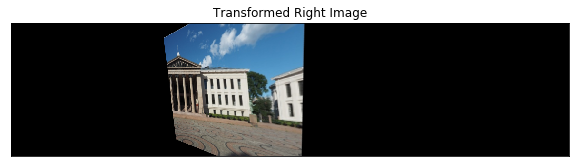

469


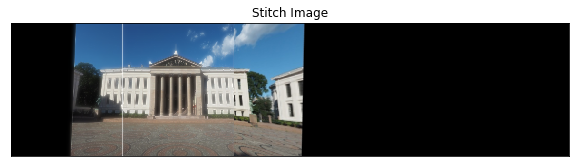

'\nOne of the best Homography I found\n[[ 1.27457522e-01  2.22557578e-01  3.11012766e+02]\n [-3.33552318e-01  9.35583792e-01  3.09856324e+01]\n [-1.84001599e-03  4.96155707e-04  1.00000000e+00]]\n'

In [690]:


# find good matches 
GoodMatches = [] 
for j, k in enumerate(matches): 
    if k.distance < 1000: 
        GoodMatches.append((k.trainIdx, k.queryIdx))       
    
# store points in two arrays 
dest = np.float32([keypoint_left[j].pt for(j, __) in GoodMatches])
source = np.float32([keypoint_right[j].pt for(__, j) in GoodMatches])  
# dest = np.float32([keypoint_left[j].pt for(__, j) in GoodMatches])
# source = np.float32([keypoint_right[j].pt for(j, __) in GoodMatches])

# best_source_inlier, best_dest_inlier  = ransac(dest, source)
best_source_inlier, best_dest_inlier  = ransac(source, dest)
    
shift = left_img.shape[1] + right_img.shape[1]
for i in range(len(source)): 
    source[i][0] += shift

# finalH, __ = cv2.findHomography(best_dest_inlier,best_source_inlier, 0)
finalH, __ = cv2.findHomography(best_source_inlier,best_dest_inlier, 0)
print("The Homography is: ", finalH)

transformed = cv2.warpPerspective(right_img, finalH, (img3.shape[1]+left_img.shape[1],left_img.shape[0])) 
# transformed = cv2.warpPerspective(img1, finalH, (img2.shape[1]+img1.shape[1],img2.shape[0]))                                  
                                    
plt.figure(figsize=(10,10))
plt.imshow(transformed), plt.title("Transformed Right Image")
plt.xticks([]), plt.yticks([])
plt.show() 
print(left_img.shape[1])

plt.figure(figsize=(10,10))

glued = transformed.copy() 
glued[:,:left_img.shape[1],:]=left_img
plt.imshow(glued), plt.title("Stitch Image")
plt.xticks([]), plt.yticks([])
plt.show() 

"""
One of the best Homography I found
[[ 1.27457522e-01  2.22557578e-01  3.11012766e+02]
 [-3.33552318e-01  9.35583792e-01  3.09856324e+01]
 [-1.84001599e-03  4.96155707e-04  1.00000000e+00]]
"""

#### 11 Stitch transformed right image and already stitched left and central images together using linear image blending.

In [614]:
# img_width: image width
# ramp_index: center ramp index
# start: starting ramp value 
# end: ending ramp value 
def linear_blending(img_width, ramp_width, ramp_index, start, end):
    array = np.zeros((img_width))
    step = (end-start)/(ramp_width-1)
    index = round(ramp_index - (ramp_width/2))
    for i in range(ramp_width): 
        array[index] = start + step * i 
        index = index + 1 
    
    array[index:] = 1
    return array 

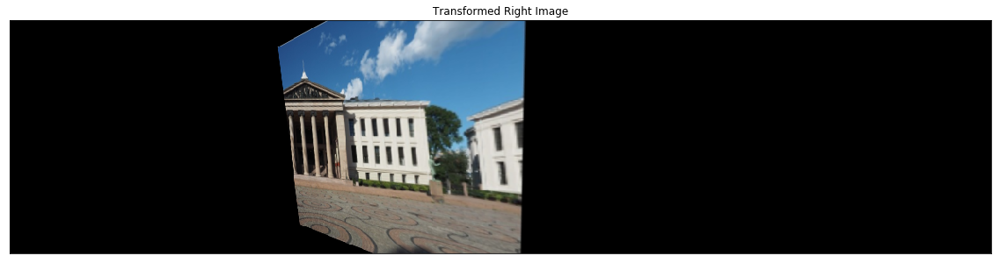

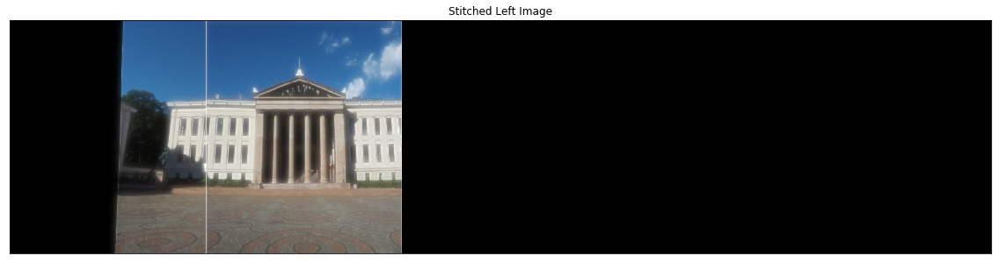

(280, 469, 3)
(280, 1173, 3)
(280, 1173, 3)


In [702]:
# copy image 
left = left_img.copy()
right = transformed.copy()

plt.figure(figsize=(20,20)), plt.xticks([]), plt.yticks([])
plt.imshow(right), plt.title("Transformed Right Image")
plt.show()

# Apply linear blending 

# rearrange image so that we can perform the linear image blending 
h = left.shape[0]
w = right.shape[1]
d = 3
wl = left.shape[1]
img_left = np.zeros((h, w, d))
img_left = img_left.astype(np.uint8)
img_left[:,:wl,:] = left

# display image on the left 
plt.figure(figsize=(20,20)), plt.xticks([]), plt.yticks([])
plt.imshow(img_left), plt.title("Stitched Left Image")
plt.show()

# check size 
print(left.shape)
print(right.shape)
print(img_left.shape)

# linear blending 
ramp_size = 40 
leftWidth = img_left.shape[1]
start = 20
alpha = linear_blending(leftWidth, ramp_size, left.shape[1] - start, 0, 1)

#### 12 Display final panoramic image. You can crop panoramic image to remove excess zero-padding; however it is not compulsory. 

(<matplotlib.image.AxesImage at 0x12a02bc18>,
 Text(0.5, 1.0, 'Image after Linear Blending'))

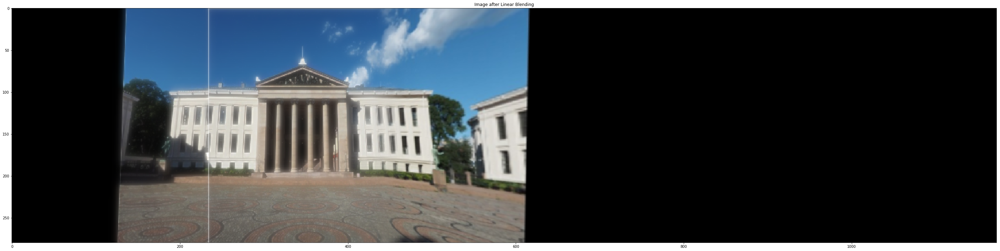

In [703]:
# calculate final image 
finalImage = (1-alpha.reshape(1,-1,1)) * img_left + \
alpha.reshape(1,-1,1)*right 

finalImage = np.uint8(finalImage)

# Display Final Image 
plt.figure(figsize=(50,50))
plt.imshow(finalImage), plt.title("Image after Linear Blending")

#### 13 Compare and comment on effectiveness of pyramid and linear blending. Discuss the pros and cons of both methods. 

From question 6, I observe that the pyramid blending has the smoothing effect -- it allows both images to have consistent color intensity. However, the stitching line still exist after pyramid blending. Also, the image blurs out a bit and it is brighter after the pyramid blending. It does not have the same RGB information as before. 

From question 12, I observe that the linear blending has a good performance overall. With the linear blending, the stitching line is removed, and color intensity does not varies a lot. The whole image does not become brighter. However, image is does not smooth perfectly around the stitching line. 


# 3 Object Detection 

#### Training 
#### 1 Resize the training images to 128 × 128

In [8]:
import os 

# read images 
train = [] 
image_list = os.listdir('./train_set/')
size = (128, 128)

# resize images
for file in image_list: 
    image = cv2.imread('./train_set/' + file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, size)
    
    # put in the list 
    train.append(image)
    
print(len(train))

30


#### 2 Compute HoG features using cell size of 4 × 4 pixels, block size of 2 × 2 cells and 9 orientation bins
(Suggestion: Make a function which takes list of images as argument and delivers list of HoG features as output. The same function can be used during testing.) 


In [9]:
# define HoG function with image list, cell size, block size 
# and number of orientation bins as inputs 
def HoG(train):
    cell_size = (4,4)
    block_size = (2,2)  
    numberOfBins = 9
    
    features = [] 
    for img in train: 
        # create Descriptor object 
        # calculate using pixel 
        hog = cv2.HOGDescriptor(_winSize=(img.shape[1]//cell_size[1]*cell_size[1],
                                img.shape[0]//cell_size[0]*cell_size[0]),
                               _blockSize=(block_size[1]*cell_size[1], 
                                          block_size[0]*cell_size[0]),
                               _blockStride=(cell_size[1], cell_size[0]),
                               _cellSize=(cell_size[1], cell_size[0]),
                               _nbins=numberOfBins)  
        
        n_cells = (img.shape[0]//cell_size[0], img.shape[1]//cell_size[1])
        
        feature = hog.compute(img).reshape(n_cells[1]-block_size[1]+1,
                                            n_cells[0] - block_size[0]+1, 
                                            block_size[1], block_size[0], numberOfBins) \
                                            .transpose((1,0,3,2,4))
        # Store features
        features.append(feature)
    
    return features
    

#### 3 Calculate and store the mean feature map across training images.

In [10]:
# compute HoG Feature, calculate and store feature maps 
features = HoG(train)

meanFeatureMap = 0 

# Calculate Mean Feature Map 
size = len(features)
meanFeatureMap = sum(features)/size

print(len(meanFeatureMap))
print(meanFeatureMap)

31
[[[[[0.11585183 0.08768709 0.09792884 ... 0.07603275 0.07742102
     0.11815521]
    [0.14255896 0.10555959 0.11815432 ... 0.10367523 0.07730372
     0.12573166]]

   [[0.1350825  0.10014805 0.09098715 ... 0.1262555  0.10513092
     0.1334602 ]
    [0.14303082 0.14575772 0.13615897 ... 0.14289519 0.09253369
     0.14014994]]]


  [[[0.1142699  0.06670024 0.08473241 ... 0.09926495 0.05233042
     0.11096691]
    [0.1411042  0.06545601 0.08068124 ... 0.13268496 0.08911793
     0.15587527]]

   [[0.1148017  0.10538471 0.11574829 ... 0.11769929 0.08426797
     0.10960568]
    [0.14947253 0.11913327 0.11281737 ... 0.17025247 0.14236447
     0.16533999]]]


  [[[0.11929275 0.05595122 0.0733832  ... 0.10218949 0.0769555
     0.14196686]
    [0.14166313 0.10230044 0.11182953 ... 0.10229611 0.10543631
     0.15889458]]

   [[0.13017873 0.10338835 0.09289124 ... 0.14965142 0.10122629
     0.15216278]
    [0.16839834 0.14361419 0.13143161 ... 0.16129659 0.12959987
     0.16781801]]]


  ...




#### 4 Display 9 orientation channels of the mean feature maps for the first block. 

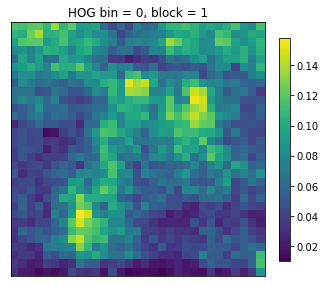

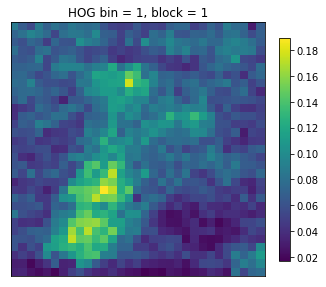

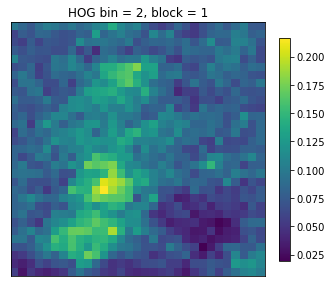

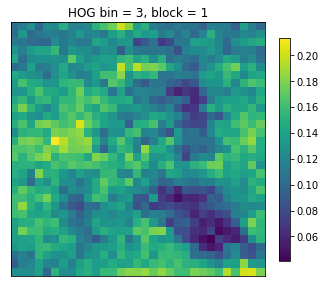

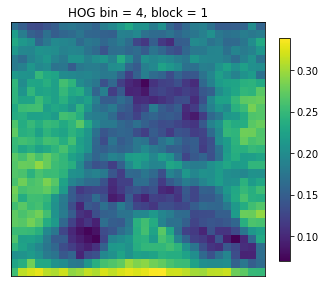

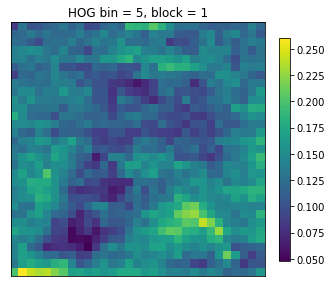

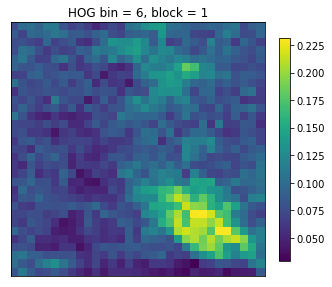

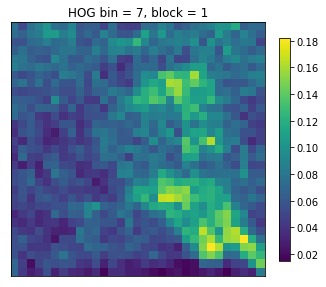

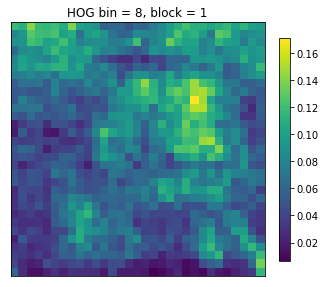

In [11]:
# Display 9 orientation channels of mean feature maps 
for i in range(9):
    plt.figure(figsize = (5,5))
    plt.pcolor(meanFeatureMap[:, :, 0, 0, i])
    plt.gca().invert_yaxis()
    plt.gca().set_aspect('equal', adjustable='box')
    plt.title("HOG bin = {}, block = 1".format(i)), plt.xticks([]), plt.yticks([])
    plt.colorbar(fraction=0.04)
    

#### Testing
#### 1 Extract overlapping windows from the test image. Experiment with stride and size of the window to achieve good performance. 
#### 2 Resize windows to 128 × 128 and Compute HoG features similar to what was done during training. 
#### 3 Compute the Euclidean distance between the feature map of each window and the mean feature map of training images.
#### 4 Threshold the Euclidean distances to detect pedestrians in the test image. Display the detected window. Experiment with threshold values in order to achieve good performance. 

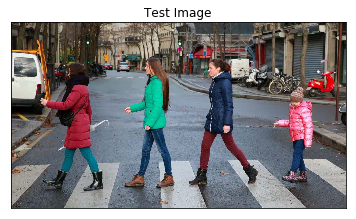

3034
min distance is  17.14303337795653
average distance is 21.668824121474263
Threshold Distance is  21.14303337795653
Found 1529 matches


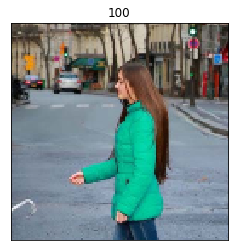

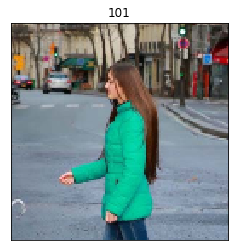

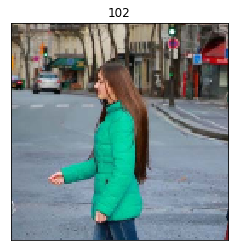

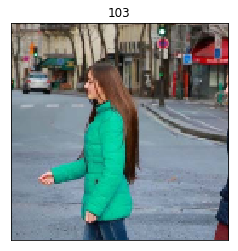

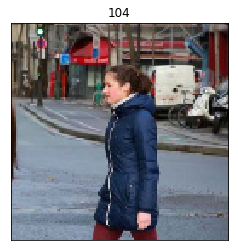

...

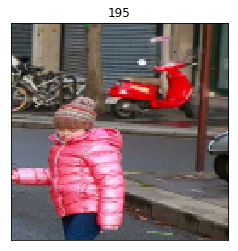

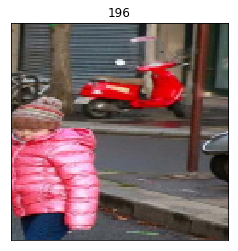

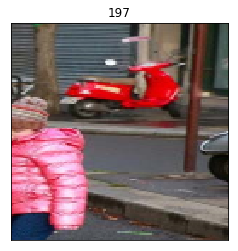

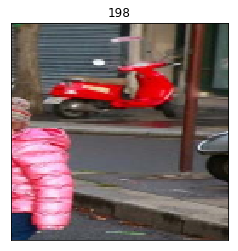

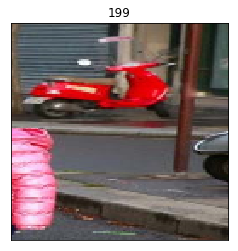

In [29]:
# slide a window through the image 
def slidingWindow(image, stepSize, windowSize):
    h = image.shape[0]
    w = image.shape[1]
    y1 = windowSize[0]
    x1 = windowSize[1]
    for y in range (0, h, stepSize): 
        for x in range (0, w, stepSize):
            yield (image[y: y + y1, x: x + x1])
            
# Display Test Image 
test_image = cv2.imread("test_image.png")
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
plt.imshow(test_image), plt.title("Test Image")
plt.xticks([]), plt.yticks([]), plt.show()

# create sliding window 

"""
Experiment With WindowSize and StepSize 
"""
test = []
stepSize = 14
windowSize = [300, 300]
windows = slidingWindow(test_image, stepSize, windowSize)

# resize images
size = (128, 128)
for image in windows: 
    resize = cv2.resize(image,size)
    test.append(resize)
    
print(len(test))

# compute HoG Feature, calculate and store feature maps 
test_features = HoG(test)

# Compute Euclidean Distance 
distance = [] 
for feature in test_features:
    d = cv2.norm(meanFeatureMap, feature, normType=cv2.NORM_L2,mask=None)
    distance.append(d)
    
# Threshold distance to detect pedestrian  

# find average distance and min distance 
minDistance = min(distance)
averageDistance = np.mean(distance)
print("min distance is ", minDistance)
print("average distance is", averageDistance)

best_indexs = [] 

"""
Experiment With Threshold Distance 
"""
# threahold Euclidean distances 
ThreshDistance = minDistance+4
print("Threshold Distance is ", ThreshDistance)
count = 0
for i, d in enumerate(distance):
    if d < ThreshDistance:
        best_indexs.append(i)
        count=count+1
        
print("Found {} matches".format(count))

# print a few sliding window images 

for index in range(100, 200):
    plt.imshow(test[best_indexs[index]]), plt.title(index)
    plt.xticks([]), plt.yticks([])
    plt.show()

After some experiment, I found that the overall pedestrian detection performance is good with the following parameters: window size [300, 300], stepSize 14, and threshold distance 21.143. The four Pedestrians extracted are shown below. 

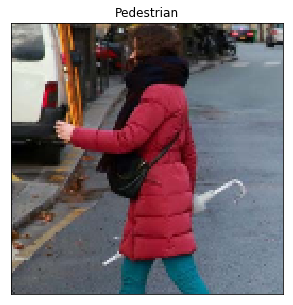

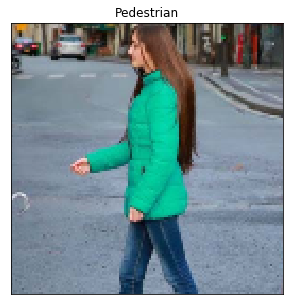

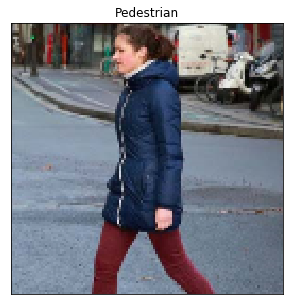

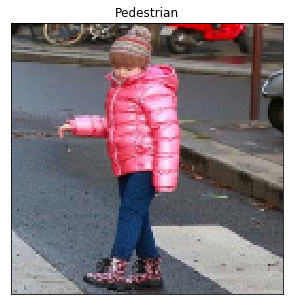

In [28]:
pedestrian = [254, 217, 222, 524]

for index in pedestrian: 
    plt.figure(figsize = (5,5))
    plt.title("Pedestrian"), plt.imshow(test[best_indexs[index]])
    plt.xticks([]),plt.yticks([]), plt.show()

#### 5 Discuss the performance of above method. Did you detect all four pedestrians in the test image? Suggest methods to improve results.